# Development of an Adaptable Deep Learning Model for Artistic Style Transfer

Our aim is to create an adaptive deep learning model that is capable of adapting an existing work to resemble the aesthetic of any art. The model analyzes the artistic style of the selected art and applies similar stylistic features to a new, original artwork, creating a piece that seems as though it could have been created by the artist themselves. This technique is called **Neural Style Transfer**, and the technique is outlined in *A Neural Algorithm of Artistic Style* (Gatys et al.).




<a name='1'></a>
## Introduction to Neural Style Transfer and Problem Statement

Neural style transfer is an optimization technique used to take two images—a *content* image and a *style reference* image (such as an artwork by a famous painter)—and blend them together so the output image looks like the content image, but “painted” in the style of the style reference image.

Given a **content image (C)** and  a **style image (S)**, our aim is to output a **generated image (G)**, such that G combines the content of C with the style of S. This is implemented by optimizing the output image to match the content features of the content image and the style features of the style reference image. These features are extracted from the images using a convolutional network.

For example, we will be using Neural Style Transfer to generate the image of a dog (content C) painted in the style of Wassily Kandinsky's Composition 7 (style S). The content, style and generated images are given below:

<img src="https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg" width="500px"/>

[Picture of a Yellow Labrador](https://commons.wikimedia.org/wiki/File:YellowLabradorLooking_new.jpg)

<img src="https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg" width="500px"/>

[Wassily Kandinsky's Composition 7](https://commons.wikimedia.org/wiki/File:Vassily_Kandinsky,_1913_-_Composition_7.jpg)

<img src="https://tensorflow.org/tutorials/generative/images/stylized-image.png" style="width: 500px;"/>

Image Generated Using Neural Style Transfer

# Setup

We will take a look at how to implement Neural Style Transfer using Tensorflow. First we set up a few things.

## Importing the Libraries

The following libraries need to be imported to ensure that the code runs smoothly

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import vgg19
from tensorflow.keras.models import load_model,Model
from PIL import Image
import time
import matplotlib.pyplot as plt
import matplotlib
import requests
import base64
import os
from pathlib import Path
from io import BytesIO
matplotlib.rcParams['figure.figsize'] = (12,12)
matplotlib.rcParams['axes.grid'] = False


# Loading the datasets

We will be using the [NeuralStyleTransfer.zip](https://drive.google.com/file/d/15IF18bDscAVg8eAta6PGtKYmLEta-Ofd/view) dataset. The dataset consists of 2 folders:
1. *content_images* : Contains real images on which style would be adapted.
2. *style_images* : Contains artistic images like paintings, whose style will be applied on a content image

If you have downloaded the Zip file from the link given above, uncomment and run the following code to extract it

In [ ]:
# Run this cell to unzip images zip file
# !unzip "/content/drive/MyDrive/Dashtoon_Assignment/neural_style.zip" -d "/content/drive/MyDrive/Dashtoon_Assignment/neural_style/"

Change the following code block to include the path of the folder that contains the downloaded dataset <br>

**content_path** : Path of *content_images* folder <br>
**style_path** : Path of *style_images* folder <br>
**choose_style** : Select any image from *style_images* folder to implement style transfer

In [ ]:
content_path = "/content/drive/MyDrive/Dashtoon_Assignment/neural_style/neural_style/content_images"
style_path = "/content/drive/MyDrive/Dashtoon_Assignment/neural_style/neural_style/style_images"
choose_style = "style1.jpg"

# Utility Functions
The following utility functions handle loading and displaying images.

In [ ]:
# Utility functions
def load_image(image_path,dim=None,resize=False):
    img= Image.open(image_path)
    if dim:
        if resize:
            img=img.resize(dim)
        else:
            img.thumbnail(dim)
    img= img.convert("RGB")
    return np.array(img)

def load_url_image(url,dim=None,resize=False):
  img_request=requests.get(url)
  img= Image.open(BytesIO(img_request.content))
  if dim:
      if resize:
          img=img.resize(dim)
      else:
          img.thumbnail(dim)
  img= img.convert("RGB")
  return np.array(img)

def array_to_img(array):
    array=np.array(array,dtype=np.uint8)
    if np.ndim(array)>3:
        assert array.shape[0]==1
        array=array[0]
    return Image.fromarray(array)

def show_image(image,title=None):
    if len(image.shape)>3:
        image=tf.squeeze(image,axis=0)
    plt.imshow(image)
    if title:
        plt.title=title
    plt.show()

def plot_images_grid(images,num_rows=1):
    n=len(images)
    if n > 1:
        num_cols=np.ceil(n/num_rows)
        fig,axes=plt.subplots(ncols=int(num_cols),nrows=int(num_rows))
        axes=axes.flatten()
        fig.set_size_inches((20,20))
        for i,image in enumerate(images):
            axes[i].axis('off')
            axes[i].imshow(image)
    else:
        plt.figure(figsize=(10,10))
        plt.imshow(images[0])

# Feature Map Generation Using VGG19 Architecture

Images are represented in memory as a multi-dimensional array of numbers (unstructured data). Convolutional neural networks are capable of decoding images and extracting meaningful features. Here VGG19 is used as the backbone to extract features. Other alternatives like ResNet can be used, but according to literature, VGG is the best for generating feature maps from images. <br>

In [ ]:
vgg=vgg19.VGG19(weights='imagenet',include_top=False)
vgg.summary()

80134624/80134624 [==============================] - 0s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                              

To classify images, the network needs to grasp the image's details. In simpler terms, it takes the initial picture, processes it, and forms an internal understanding of what's in the image. This is why convolutional neural networks work well—they can pick up key features and patterns in different classes like cats or dogs while ignoring background noise. So, between feeding the raw image into the model and getting the final classification, the model acts as a tool to extract detailed information about the input images.

In [ ]:
# Defining the layers from which we will get the feature maps
content_layers=['block4_conv2']
style_layers=['block1_conv1',
            'block2_conv1',
            'block3_conv1',
            'block4_conv1',
            'block5_conv1']
content_layers_weights=[1]
style_layers_weights=[1]*5

The below class **FeatureModel** implements the process of extracting the features from VGG19. Content and style image activations are extracted from the defined layers and returned.


In [ ]:
class FeatureModel:
    def __init__(self,pretrained_model,content_layers,style_layers):
        self.model=pretrained_model
        self.content_layers=content_layers
        self.style_layers=style_layers
        self.loss_model=self.get_model()

    def get_model(self):
        self.model.trainable=False
        layer_names=self.style_layers + self.content_layers
        outputs=[self.model.get_layer(name).output for name in layer_names]
        new_model=Model(inputs=self.model.input,outputs=outputs)
        return new_model

    def get_activations(self,inputs):
        inputs=inputs*255.0
        style_length=len(self.style_layers)
        outputs=self.loss_model(vgg19.preprocess_input(inputs))
        style_output,content_output=outputs[:style_length],outputs[style_length:]
        content_dict={name:value for name,value in zip(self.content_layers,content_output)}
        style_dict={name:value for name,value in zip(self.style_layers,style_output)}
        return {'content':content_dict,'style':style_dict}

In [ ]:
feature_model=FeatureModel(vgg,content_layers,style_layers)

<h1>Implementing the Loss Function<h1>

The information contained in an image is represented by the values in the intermediate feature maps. Interestingly, the style of an image can be explained by looking at the averages and relationships between the various feature maps. This can be implemented using a Gram matrix. This involves taking the outer product of the feature vector with itself at each spot and then averaging that outer product over all spots.

The loss function implementations are taken from https://www.tensorflow.org/tutorials/generative/style_transfer

In [ ]:
def content_loss(placeholder,content,weight):
    assert placeholder.shape == content.shape
    return weight*tf.reduce_mean(tf.square(placeholder-content))
def gram_matrix(x):
    gram=tf.linalg.einsum('bijc,bijd->bcd', x, x)
    return gram/tf.cast(x.shape[1]*x.shape[2]*x.shape[3],tf.float32)
def style_loss(placeholder,style,weight):
    assert placeholder.shape == style.shape
    s=gram_matrix(style)
    p=gram_matrix(placeholder)
    return weight*tf.reduce_mean(tf.square(s-p))

Perceptual Loss:

A way to improve the loss function is by using perceptual loss (https://arxiv.org/abs/1603.08155). Essentially it maintains the previous losses but makes the image generation much faster

In [ ]:
def preceptual_loss(predicted_activations,content_activations,style_activations,content_weight,style_weight,content_layers_weights,style_layer_weights):
    pred_content=predicted_activations["content"]
    pred_style=predicted_activations["style"]
    c_loss=tf.add_n([content_loss(pred_content[name],content_activations[name],content_layers_weights[i]) for i,name in enumerate(pred_content.keys())])
    c_loss=c_loss*content_weight
    s_loss=tf.add_n([style_loss(pred_style[name],style_activations[name],style_layer_weights[i]) for i,name in enumerate(pred_style.keys())])
    s_loss=s_loss*style_weight
    return c_loss+s_loss

# Model

Credit to [Generate Art using Fast Style Transfer in a Second](https://www.kaggle.com/code/tarunbisht11/generate-art-using-fast-style-transfer-in-a-second/notebook) for the model implementation

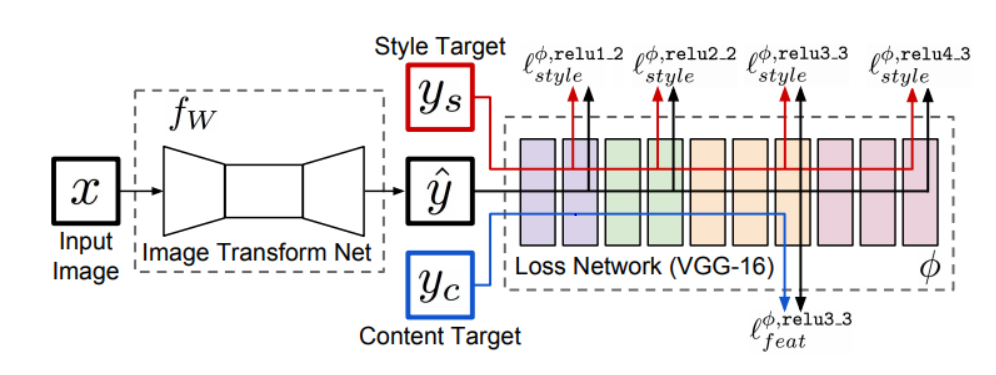

**Why do we choose this particular architecture?**

The main task for inference would be conversion of any image to a stylized image. Encoder-Decoder models perform exceptionally well in reconstructing the the input, given the original. We can train an encoder-decoder model to take any image as input and apply styles to it.

\
Other improvements: \
1) Using Instance Normalization (as in *Instance Normalization: The Missing Ingredient for Fast Stylization*) \
2) Using Reflective Padding

In [ ]:
class ReflectionPadding2D(tf.keras.layers.Layer):
    def __init__(self, padding=(1, 1), **kwargs):
        super(ReflectionPadding2D, self).__init__(**kwargs)
        self.padding = tuple(padding)
    def call(self, input_tensor):
        padding_width, padding_height = self.padding
        return tf.pad(input_tensor, [[0,0], [padding_height, padding_height], [padding_width, padding_width], [0,0] ], 'REFLECT')

class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self,**kwargs):
        super(InstanceNormalization, self).__init__(**kwargs)
    def call(self,inputs):
        batch, rows, cols, channels = [i for i in inputs.get_shape()]
        mu, var = tf.nn.moments(inputs, [1,2], keepdims=True)
        shift = tf.Variable(tf.zeros([channels]))
        scale = tf.Variable(tf.ones([channels]))
        epsilon = 1e-3
        normalized = (inputs-mu)/tf.sqrt(var + epsilon)
        return scale * normalized + shift

class ConvLayer(tf.keras.layers.Layer):
    def __init__(self,filters,kernel_size,strides=1,**kwargs):
        super(ConvLayer,self).__init__(**kwargs)
        self.padding=ReflectionPadding2D([k//2 for k in kernel_size])
        self.conv2d=tf.keras.layers.Conv2D(filters,kernel_size,strides)
        self.bn=InstanceNormalization()
    def call(self,inputs):
        x=self.padding(inputs)
        x=self.conv2d(x)
        x=self.bn(x)
        return x
class ResidualLayer(tf.keras.layers.Layer):
    def __init__(self,filters,kernel_size,**kwargs):
        super(ResidualLayer,self).__init__(**kwargs)
        self.conv2d_1=ConvLayer(filters,kernel_size)
        self.conv2d_2=ConvLayer(filters,kernel_size)
        self.relu=tf.keras.layers.ReLU()
        self.add=tf.keras.layers.Add()
    def call(self,inputs):
        residual=inputs
        x=self.conv2d_1(inputs)
        x=self.relu(x)
        x=self.conv2d_2(x)
        x=self.add([x,residual])
        return x
class UpsampleLayer(tf.keras.layers.Layer):
    def __init__(self,filters,kernel_size,strides=1,upsample=2,**kwargs):
        super(UpsampleLayer,self).__init__(**kwargs)
        self.upsample=tf.keras.layers.UpSampling2D(size=upsample)
        self.padding=ReflectionPadding2D([k//2 for k in kernel_size])
        self.conv2d=tf.keras.layers.Conv2D(filters,kernel_size,strides)
        self.bn=InstanceNormalization()
    def call(self,inputs):
        x=self.upsample(inputs)
        x=self.padding(x)
        x=self.conv2d(x)
        return self.bn(x)

In [ ]:
class StyleTransferModel(tf.keras.Model):
    def __init__(self,**kwargs):
        super(StyleTransferModel, self).__init__(name='StyleTransferModel',**kwargs)
        self.conv2d_1= ConvLayer(filters=32,kernel_size=(9,9),strides=1,name="conv2d_1_32")
        self.conv2d_2= ConvLayer(filters=64,kernel_size=(3,3),strides=2,name="conv2d_2_64")
        self.conv2d_3= ConvLayer(filters=128,kernel_size=(3,3),strides=2,name="conv2d_3_128")
        self.res_1=ResidualLayer(filters=128,kernel_size=(3,3),name="res_1_128")
        self.res_2=ResidualLayer(filters=128,kernel_size=(3,3),name="res_2_128")
        self.res_3=ResidualLayer(filters=128,kernel_size=(3,3),name="res_3_128")
        self.res_4=ResidualLayer(filters=128,kernel_size=(3,3),name="res_4_128")
        self.res_5=ResidualLayer(filters=128,kernel_size=(3,3),name="res_5_128")
        self.deconv2d_1= UpsampleLayer(filters=64,kernel_size=(3,3),name="deconv2d_1_64")
        self.deconv2d_2= UpsampleLayer(filters=32,kernel_size=(3,3),name="deconv2d_2_32")
        self.deconv2d_3= ConvLayer(filters=3,kernel_size=(9,9),strides=1,name="deconv2d_3_3")
        self.relu=tf.keras.layers.ReLU()
    def call(self, inputs):
        x=self.conv2d_1(inputs)
        x=self.relu(x)
        x=self.conv2d_2(x)
        x=self.relu(x)
        x=self.conv2d_3(x)
        x=self.relu(x)
        x=self.res_1(x)
        x=self.res_2(x)
        x=self.res_3(x)
        x=self.res_4(x)
        x=self.res_5(x)
        x=self.deconv2d_1(x)
        x=self.relu(x)
        x=self.deconv2d_2(x)
        x=self.relu(x)
        x=self.deconv2d_3(x)
        x = (tf.nn.tanh(x) + 1) * (255.0 / 2)
        return x

    def print_shape(self,inputs):
        print(inputs.shape)
        x=self.conv2d_1(inputs)
        print(x.shape)
        x=self.relu(x)
        x=self.conv2d_2(x)
        print(x.shape)
        x=self.relu(x)
        x=self.conv2d_3(x)
        print(x.shape)
        x=self.relu(x)
        x=self.res_1(x)
        print(x.shape)
        x=self.res_2(x)
        print(x.shape)
        x=self.res_3(x)
        print(x.shape)
        x=self.res_4(x)
        print(x.shape)
        x=self.res_5(x)
        print(x.shape)
        x=self.deconv2d_1(x)
        print(x.shape)
        x=self.relu(x)
        x=self.deconv2d_2(x)
        print(x.shape)
        x=self.relu(x)
        x=self.deconv2d_3(x)
        print(x.shape)

In [ ]:
input_shape=(256,256,3)
batch_size=16

In [ ]:
style_model = StyleTransferModel()

# Training code

How training works:

Content images are fed to the encoder decoder model and outputs are obtained in forward pass. Then perceptual loss is used to update the weights of the model.

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
def train_step(dataset,style_activations,steps_per_epoch,style_model,loss_model,optimizer,checkpoint_path="./",content_weight=1e4,style_weight=1e-2,total_variation_weight=0.004,content_layers_weights=[1],style_layers_weights=[1]*5):
    batch_losses=[]
    steps=1
    save_path=os.path.join(checkpoint_path,f"model_checkpoint.ckpt")
    print("Model Checkpoint Path: ",save_path)
    for input_image_batch in dataset:
        if steps-1 >= steps_per_epoch:
            break
        with tf.GradientTape() as tape:
            outputs=style_model(input_image_batch)
            outputs=tf.clip_by_value(outputs, 0, 255)
            pred_activations=loss_model.get_activations(outputs/255.0)
            content_activations=loss_model.get_activations(input_image_batch)["content"]
            curr_loss=preceptual_loss(pred_activations,content_activations,style_activations,content_weight,
                                      style_weight,content_layers_weights,style_layers_weights)
            curr_loss += total_variation_weight*tf.image.total_variation(outputs)
        batch_losses.append(curr_loss)
        grad = tape.gradient(curr_loss,style_model.trainable_variables)
        optimizer.apply_gradients(zip(grad,style_model.trainable_variables))
        if steps%100==0:
            print("checkpoint saved ",end=" ")
            style_model.save_weights(save_path)
            print(f"Loss: {tf.reduce_mean(batch_losses).numpy()}")
        steps+=1
    return tf.reduce_mean(batch_losses)

In [ ]:
class TensorflowDatasetLoader:
    def __init__(self,dataset_path,batch_size=4, image_size=(256, 256),num_images=None):
        images_paths = [str(path) for path in Path(dataset_path).glob("*.jpg")]
        self.length=len(images_paths)
        if num_images is not None:
            images_paths = images_paths[0:num_images]
        dataset = tf.data.Dataset.from_tensor_slices(images_paths).map(
            lambda path: self.load_tf_image(path, dim=image_size),
            num_parallel_calls=tf.data.experimental.AUTOTUNE,
        )
        dataset = dataset.batch(batch_size,drop_remainder=True)
        dataset = dataset.repeat()
        dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
        self.dataset=dataset
    def __len__(self):
        return self.length
    def load_tf_image(self,image_path,dim):
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image= tf.image.resize(image,dim)
        image= image/255.0
        image = tf.image.convert_image_dtype(image, tf.float32)
        return image

Visualizing content images

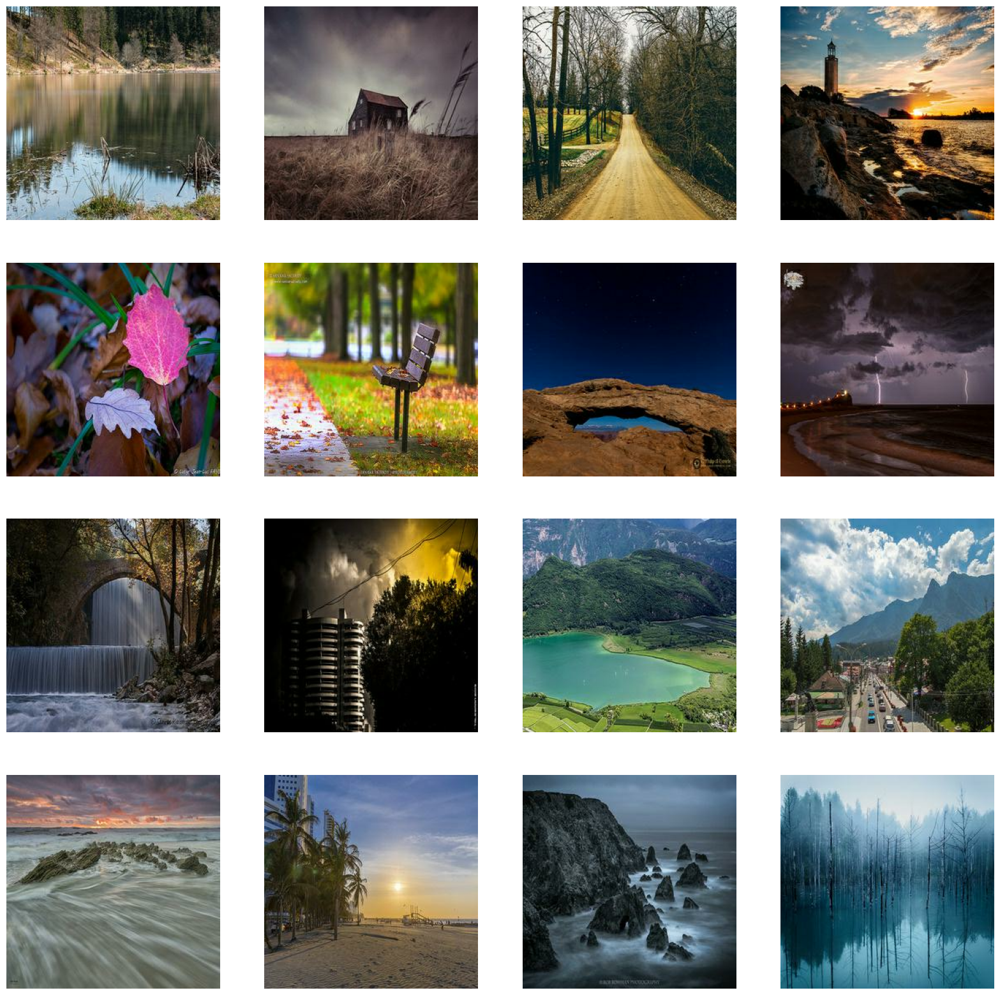

In [ ]:
loader=TensorflowDatasetLoader(content_path,batch_size=batch_size)
plot_images_grid(next(iter(loader.dataset.take(1))),num_rows=4)

Visualizing style images

Note, this is the style image chosen previously

In [ ]:
style_image_path =os.path.join(style_path,choose_style)
style_image=load_image(style_image_path,dim=(input_shape[0],input_shape[1]),resize=True)
style_image=style_image/255.0

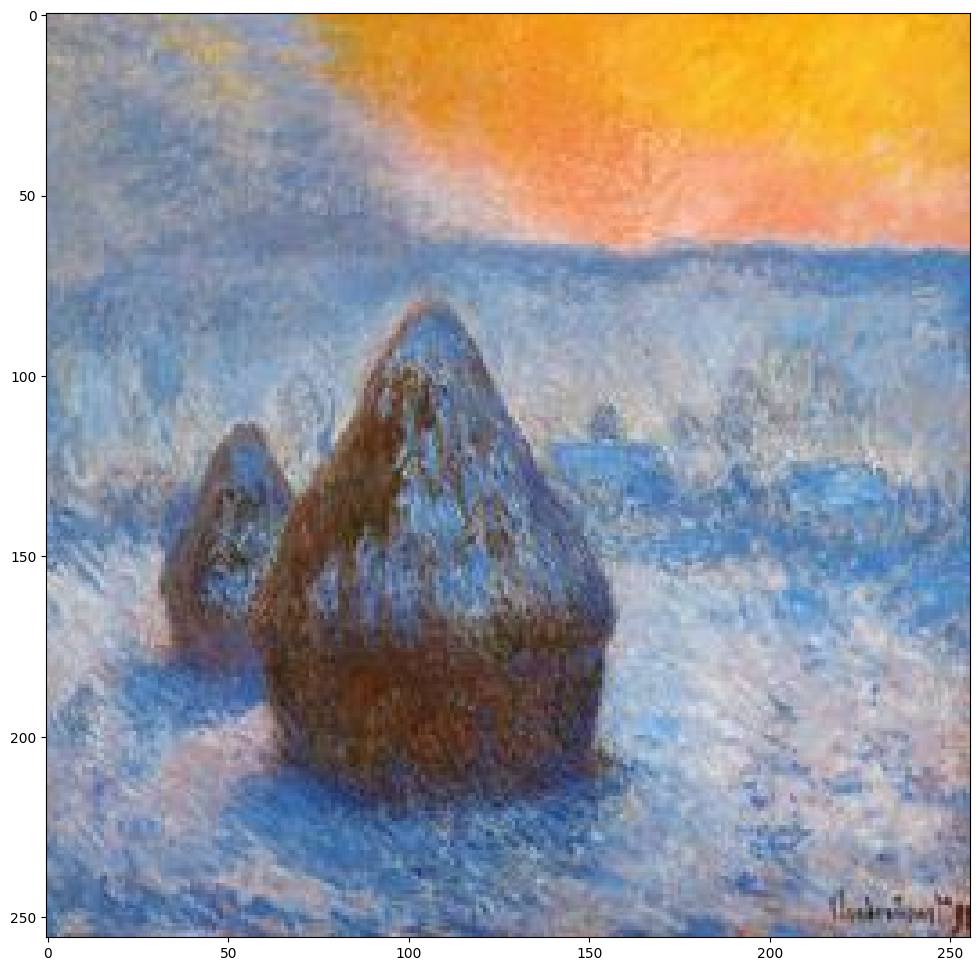

In [ ]:
show_image(style_image)

In [ ]:
style_image=style_image.astype(np.float32)
style_image_batch=np.repeat([style_image],batch_size,axis=0)
style_activations=feature_model.get_activations(style_image_batch)["style"]

# Training code

Note that this code implements checkpointing. Please provide save paths for model weights

In [ ]:
epochs=10
content_weight=2*1e1
style_weight=1e2
total_variation_weight=0.004

In [ ]:
num_images=len(loader)
steps_per_epochs=num_images//batch_size
print(steps_per_epochs)

model_save_path="/content/drive/MyDrive/Dashtoon_Assignment/nst_model_weights"

os.makedirs(model_save_path,exist_ok=True)

439


In [ ]:
if os.path.isfile(os.path.join(model_save_path,"model_checkpoint.ckpt.index")):
    style_model.load_weights(os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print("Found a checkpoint")
else:
    print("No checkpoint found")

Found a checkpoint


In [ ]:
epoch_losses=[]
for epoch in range(1,epochs+1):
    print(f"epoch: {epoch}")
    batch_loss=train_step(loader.dataset,style_activations,steps_per_epochs,style_model,loss_model,optimizer,
                          model_save_path,
                          content_weight,style_weight,total_variation_weight,
                          content_layers_weights,style_layers_weights)
    style_model.save_weights(os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print("Model Checkpointed at: ",os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print(f"loss: {batch_loss.numpy()}")
    epoch_losses.append(batch_loss)

In [ ]:
# # plt.plot(epoch_losses)
# # plt.xlabel("Epochs")
# plt.ylabel("Loss")
# # plt.title("Training Process")
# # plt.show()

In [ ]:
if os.path.isfile(os.path.join(model_save_path,"model_checkpoint.ckpt.index")):
    style_model.load_weights(os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print("loading weights ...")
else:
    print("no weights found ...")

# Inference

In [ ]:
styled_images = []

for images in loader.dataset.take(1):
    images = images * 255.0
    generated_images = style_model(images)
    generated_images = np.clip(generated_images,0,255)
    generated_images = generated_images.astype(np.uint8)
    for image in generated_images:
        styled_images.append(image)

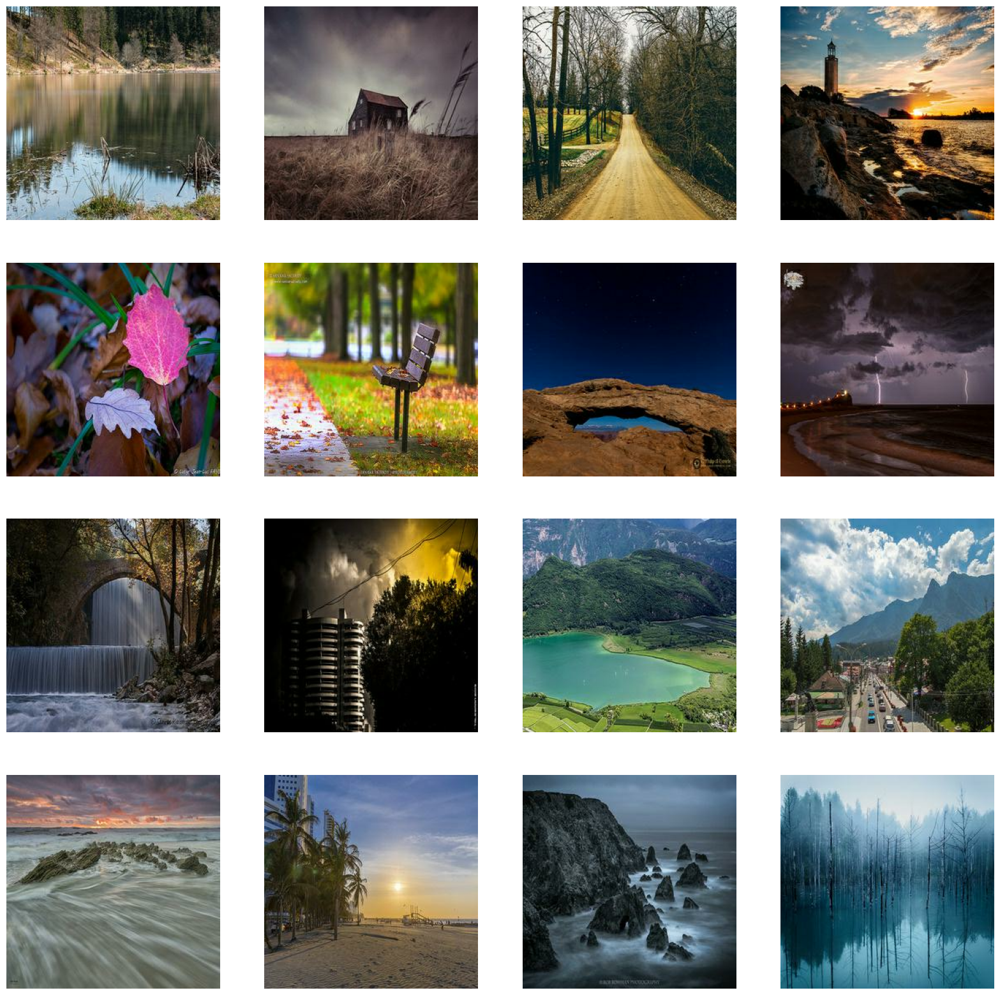

In [ ]:
plot_images_grid(next(iter(loader.dataset.take(1))),num_rows = 4)

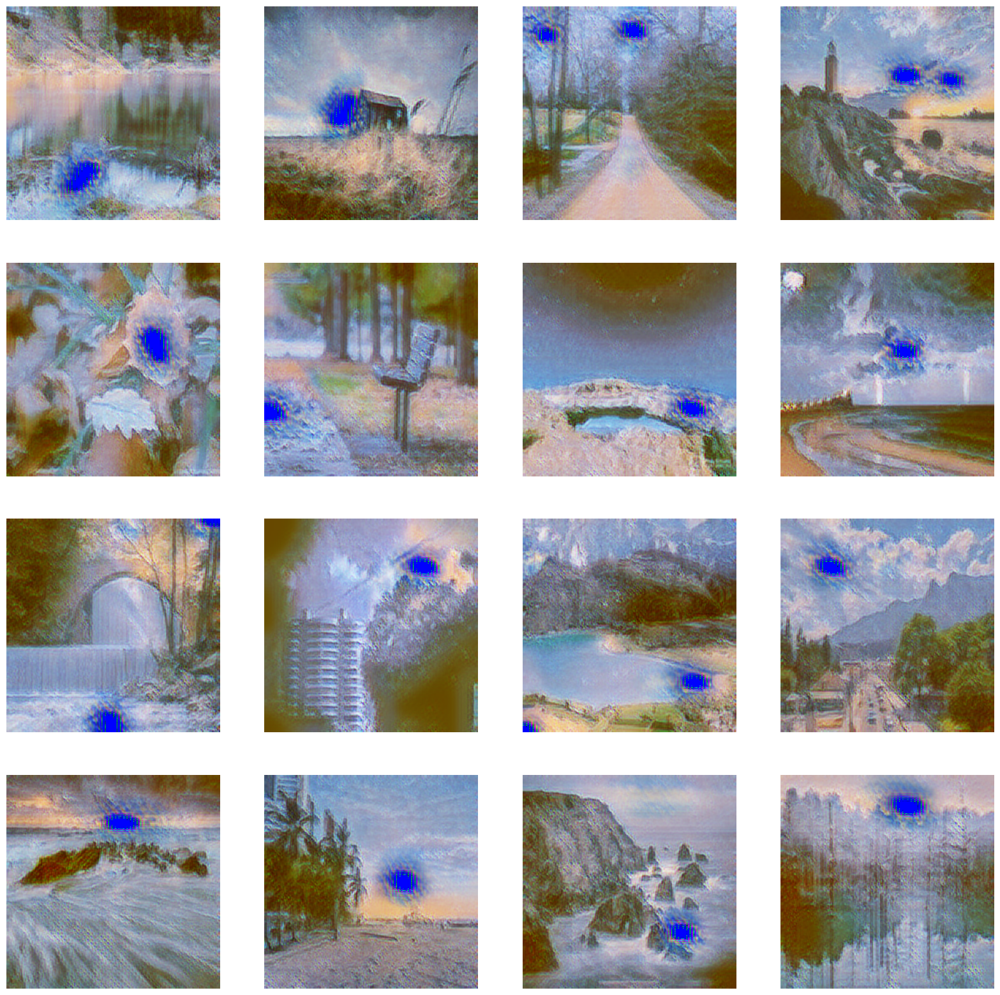

In [ ]:
plot_images_grid(styled_images,num_rows = 4)